# Introduction
* **Reference**:
  * [Ultralytics' github](https://github.com/ultralytics/ultralytics)
  * [Ultralytics' Reference](https://docs.ultralytics.com/reference/cfg/__init__/)
  * [Ultralytics' Usage](https://docs.ultralytics.com/usage/python/)

# 1- Install, import and define ultilities
* Library for yolov8: **ultralytics**
    * Turn on the commands given below to install/uninstall the library
* To use the library: ```from ultralytics import YOLO``` 
* Define function ```show_images``` for display images passed to its parameters


In [69]:
# code to install and uninstall ultralytics
#!pip uninstall ultralytics
#!pip install ultralytics

In [41]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import cv2
from PIL import Image
import os
import ultralytics
from ultralytics import YOLO

def show_images(*images, title="", figsize=(12,6), gap_size=5, padded_gray = 100):
    ndim = images[0].ndim 
    assert all([image.ndim for image in images]) and ((ndim == 2) or (ndim == 3)), \
        "images: must the same num. of dimensions, and must be 2 (gray) or 3 (color)"
    
    h_max = max([image.shape[0] for image in images])
    w_max = max([image.shape[1] for image in images])
    results = []
    if ndim == 2:
        gap = padded_gray*np.ones([h_max, gap_size], dtype=np.uint8)
        for image in images:
            h, w = image.shape
            padded = padded_gray*np.ones([h_max, w_max], dtype=np.uint8)
            padded[:h, :w] = image
            results.append(padded)
            results.append(gap)
        results = results[:-1]
        combined = np.hstack(results)
        #
        plt.figure(figsize=figsize)
        plt.imshow(combined, cmap='gray')
        plt.axis("off")
        plt.title(title)
        plt.show()
        
    else:
        gap = padded_gray*np.ones([h_max, gap_size, 3], dtype=np.uint8)
        for image in images:
            h, w, _ = image.shape
            padded = padded_gray*np.ones([h_max, w_max, 3], dtype=np.uint8)
            padded[:h, :w, :] = image
            results.append(padded)
            results.append(gap)
        results = results[:-1]
        combined = np.hstack(results)
        #
        plt.figure(figsize=figsize)
        plt.imshow(combined)
        plt.axis("off")
        plt.title(title)
        plt.show()
    

# 2- Inference
* Reference: [predict's parameters](https://github.com/ultralytics/ultralytics/blob/main/docs/modes/predict.md)

## Hyperlink-1


Found https://media.roboflow.com/notebooks/examples/dog.jpeg locally at dog.jpeg
image 1/1 /workspace/YOLO/demo/dog.jpeg: 640x384 1 person, 1 car, 1 dog, 8.2ms
Speed: 1.9ms preprocess, 8.2ms inference, 1.8ms postprocess per image at shape (1, 3, 640, 384)


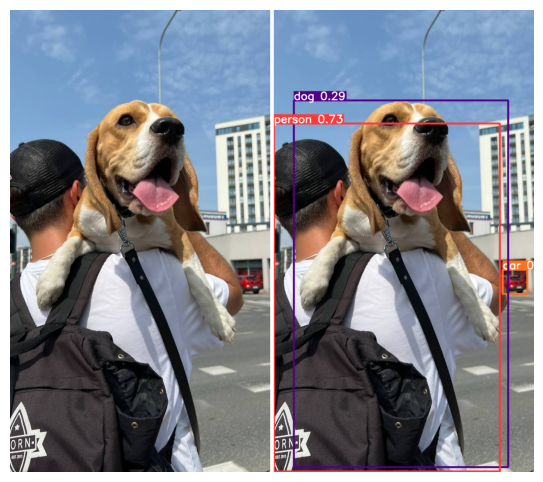

In [44]:
model = YOLO('yolov8n.pt') #load model from file
links = 'https://media.roboflow.com/notebooks/examples/dog.jpeg'
results = model.predict(
   source=links,
   conf=0.25 #select only boxes >= conf
)

#show the results
for idx, result in enumerate(results):
    original_img_rgb = result.orig_img[..., ::-1]
    annotated_img_rgb = result.plot()[..., ::-1] 
    show_images(original_img_rgb, annotated_img_rgb, gap_size=10, padded_gray = 255)


## Hyperlink-2


0: 640x640 1 person, 1 car, 1 dog, 1: 640x640 4 persons, 2 cars, 2: 640x640 2 sheeps, 140.3ms
Speed: 2.8ms preprocess, 46.8ms inference, 1.0ms postprocess per image at shape (1, 3, 640, 640)


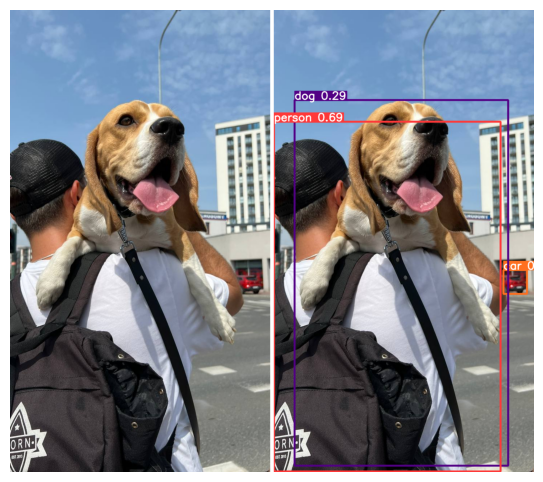

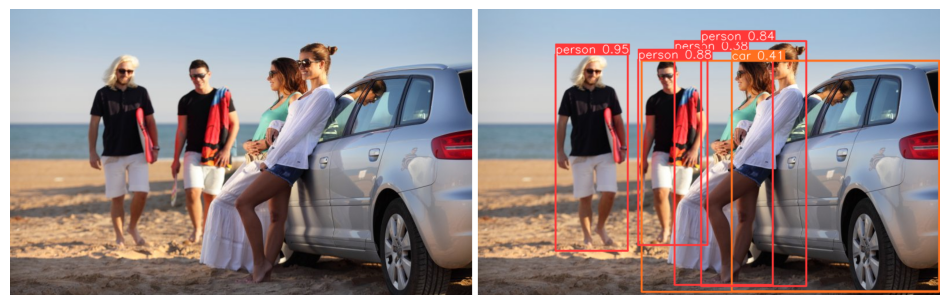

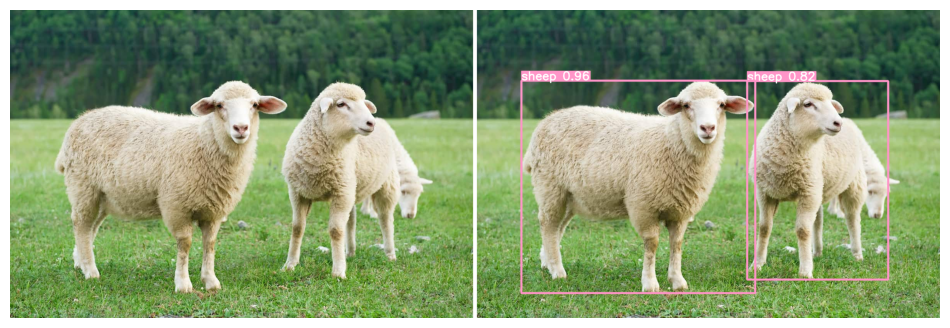

In [45]:
model = YOLO('yolov8n.pt') #load model from file
links = ['https://media.roboflow.com/notebooks/examples/dog.jpeg',
           'https://s3-eu-west-1.amazonaws.com/%2Fgoldcar/goldcarweb/landings/full/jovenes.jpeg',
           'https://morningchores.com/wp-content/uploads/2020/07/Sheep-Terms.jpg'
        ]
results = model.predict(
   source=links,
   conf=0.25 #select only boxes >= conf
)

#show the results
for idx, result in enumerate(results):
    original_img_rgb = result.orig_img[..., ::-1]
    annotated_img_rgb = result.plot()[..., ::-1] 
    show_images(original_img_rgb, annotated_img_rgb, gap_size=10, padded_gray = 255)


## Download and detect


0: 448x640 2 persons, 3 cups, 2 chairs, 1 dining table, 1 laptop, 6.9ms
Speed: 3.0ms preprocess, 6.9ms inference, 1.6ms postprocess per image at shape (1, 3, 448, 640)


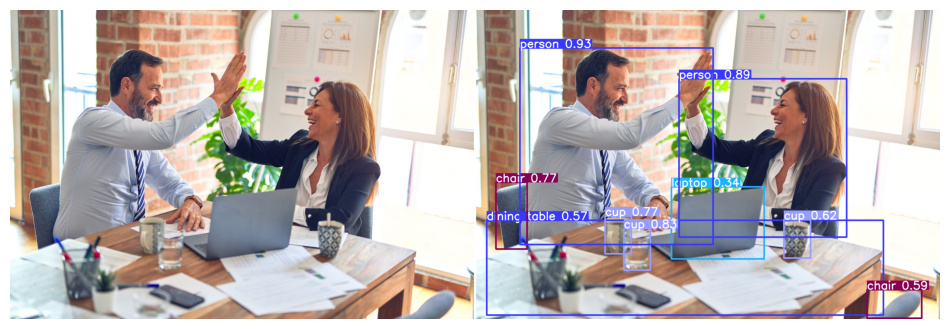

In [48]:
import requests
from io import BytesIO

#download image
response = requests.get("https://images.unsplash.com/photo-1600880292203-757bb62b4baf?ixlib=rb-4.0.3&ixid=MnwxMjA3fDB8MHxwaG90by1wYWdlfHx8fGVufDB8fHx8&auto=format&fit=crop&w=2070&q=80")
ori_image = Image.open(BytesIO(response.content))
ori_image = np.asarray(ori_image)

# predict
results = model.predict(
   ori_image,
   conf=0.25 #select only boxes >= conf
)

#show the results
for idx, result in enumerate(results):
    original_img_rgb = result.orig_img
    annotated_img_rgb = result.plot()
    show_images(original_img_rgb, annotated_img_rgb, gap_size=10, padded_gray = 255)


0: 640x640 1 chair, 1 laptop, 1 mouse, 1 book, 7.4ms
Speed: 3.2ms preprocess, 7.4ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 640)


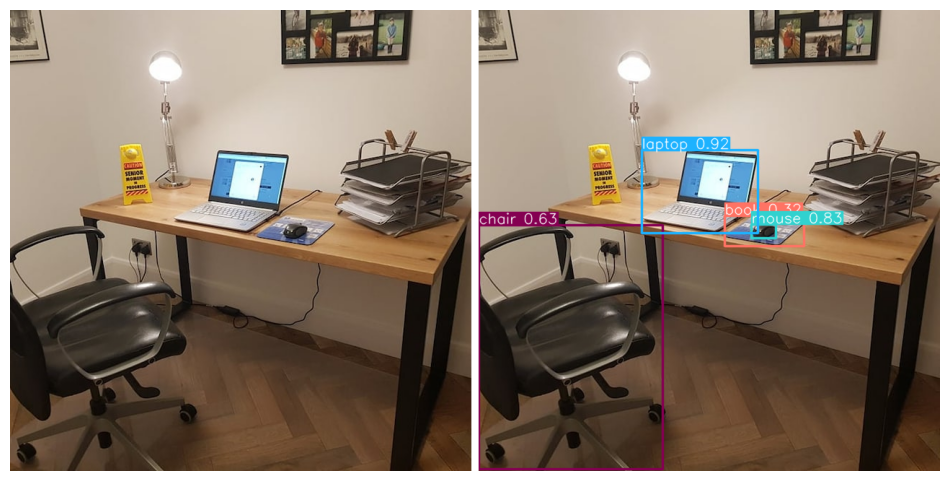

In [51]:
import requests
from io import BytesIO

#download image
#link = 'https://wallpapers.com/images/high/baby-animal-puppies-on-the-field-wmsvikfmzvhh3aot.webp'
link = 'https://i.etsystatic.com/iap/debdcf/3581779783/iap_640x640.3581779783_ek5d7stn.jpg?version=0'

response = requests.get(link)
ori_image = Image.open(BytesIO(response.content))
ori_image = np.asarray(ori_image)

# predict
results = model.predict(
   ori_image,
   conf=0.25 #select only boxes >= conf
)

#show the results
for idx, result in enumerate(results):
    original_img_rgb = result.orig_img
    annotated_img_rgb = result.plot()
    show_images(original_img_rgb, annotated_img_rgb, gap_size=10, padded_gray = 255)

## Folder

### Download images

In [55]:
%%bash
pip -q install --upgrade --no-cache-dir gdown
gdown -q 1Do8SXKm4rmXW-phHlejV-udLfhSyYgKk
echo 'download: done => file: animals10small.zip'
rm -rf ./animals10small/
unzip -q animals10small.zip


[notice] A new release of pip is available: 23.2.1 -> 23.3.1
[notice] To update, run: python3 -m pip install --upgrade pip


download: done => file: animals10small.zip



image 1/100 /workspace/YOLO/demo/animals10small/data/cat/1.jpeg: 448x640 1 cat, 1 couch, 16.5ms
image 2/100 /workspace/YOLO/demo/animals10small/data/cat/10.jpeg: 416x640 5 cats, 9.7ms
image 3/100 /workspace/YOLO/demo/animals10small/data/cat/100.jpeg: 640x640 1 cat, 9.2ms
image 4/100 /workspace/YOLO/demo/animals10small/data/cat/101.jpeg: 640x640 1 cat, 7.5ms
image 5/100 /workspace/YOLO/demo/animals10small/data/cat/103.jpeg: 448x640 1 cat, 7.7ms
image 6/100 /workspace/YOLO/demo/animals10small/data/cat/104.jpeg: 640x640 1 cat, 1 vase, 7.5ms
image 7/100 /workspace/YOLO/demo/animals10small/data/cat/106.jpeg: 512x640 1 frisbee, 8.1ms
image 8/100 /workspace/YOLO/demo/animals10small/data/cat/109.jpeg: 640x448 1 cat, 9.0ms
image 9/100 /workspace/YOLO/demo/animals10small/data/cat/11.jpeg: 640x640 1 cat, 7.9ms
image 10/100 /workspace/YOLO/demo/animals10small/data/cat/110.jpeg: 512x640 (no detections), 7.6ms
image 11/100 /workspace/YOLO/demo/animals10small/data/cat/111.jpeg: 640x640 1 cat, 1 dog,

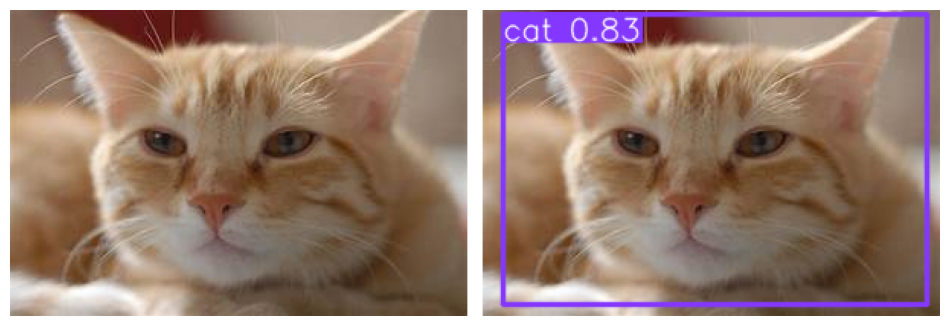

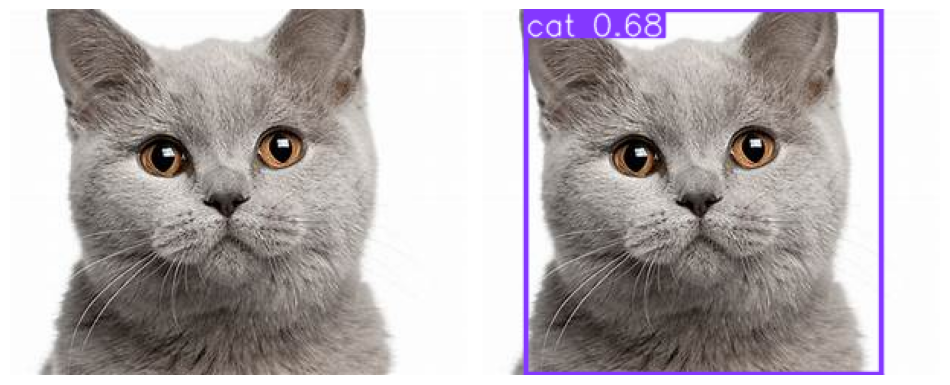

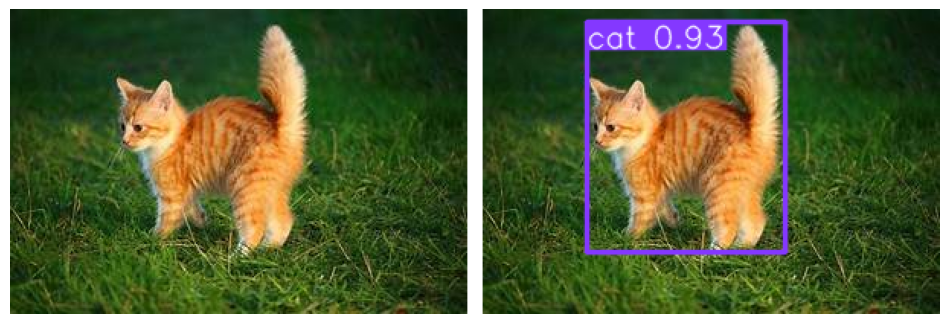

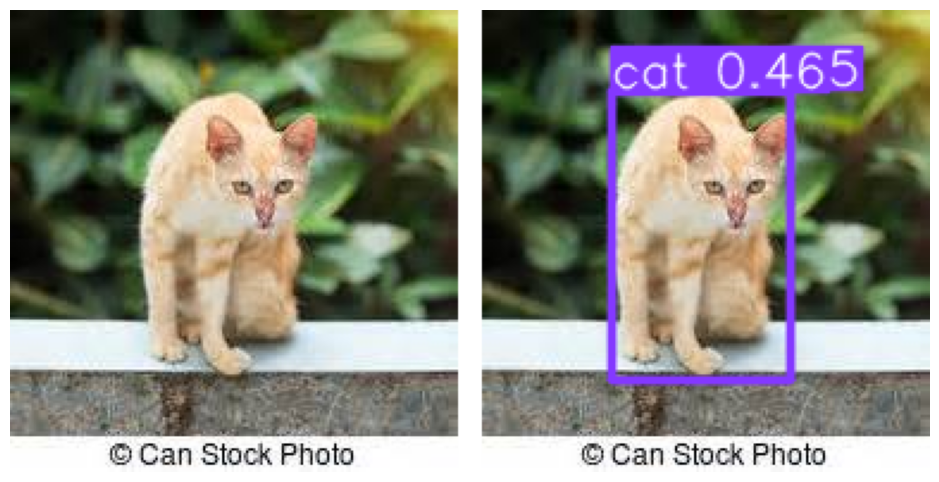

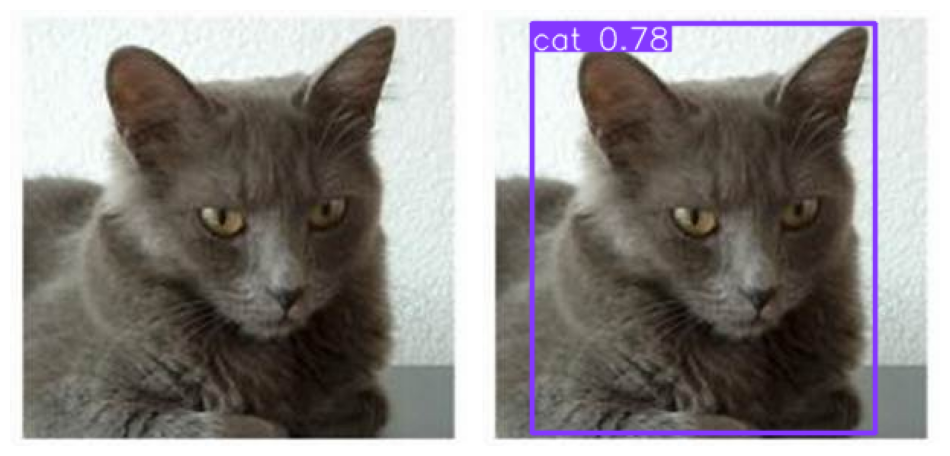

In [61]:
path_to_data = "./animals10small/data/cat"
results = model.predict(
   source= path_to_data, #folder
   conf=0.2
)

#show 5 results
import random
displayed_max = min(5, len(results))
selected = random.sample(range(len(results)), displayed_max)
for idx in selected:
    result = results[idx]
    original_img_rgb = result.orig_img[:,:, ::-1]
    annotated_img_rgb = result.plot()[:,:, ::-1]
    show_images(original_img_rgb, annotated_img_rgb, gap_size=10, padded_gray = 255)

## Batch

In [63]:
import glob
import os
from torch.utils.data import Dataset
import PIL

class FolderDataset(Dataset):
  def __init__(self, folder:str, transform=None):
    self.folder = folder
    self.transform = transform
    self.all_files = glob.glob(os.path.join(folder, '*'))

  def __len__(self):
    return len(self.all_files)

  def __getitem__(self, idx):
    filename = self.all_files[idx]
    image = PIL.Image.open(filename)
    if self.transform:
        image = self.transform(image)
    return image



0: 256x256 1 cat, 1: 256x256 1 cat, 2: 256x256 1 cat, 3: 256x256 1 cat, 4: 256x256 1 cat, 5: 256x256 1 cat, 6: 256x256 1 dog, 7: 256x256 1 cat, 8: 256x256 1 cat, 9: 256x256 1 cat, 18.6ms
Speed: 0.3ms preprocess, 1.9ms inference, 2.4ms postprocess per image at shape (1, 3, 256, 256)


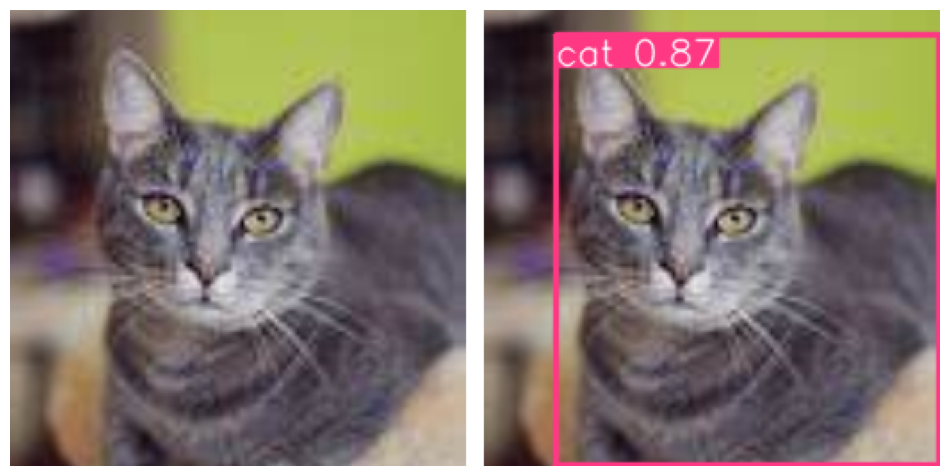

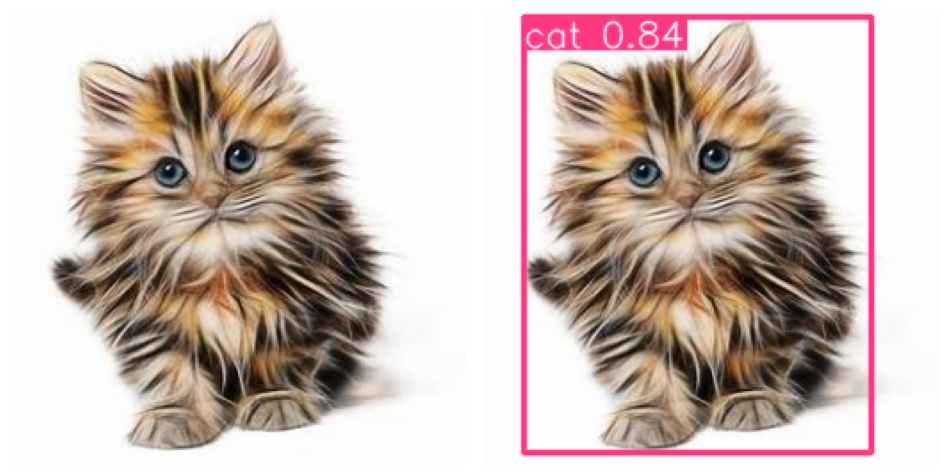

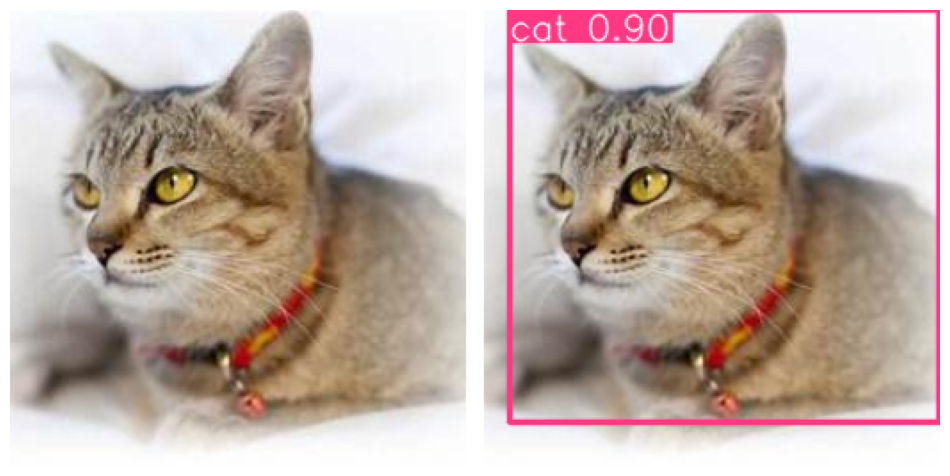

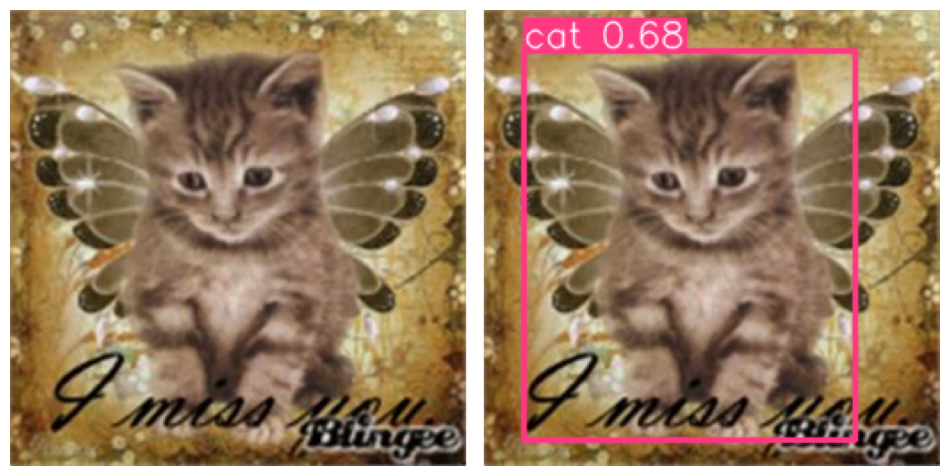

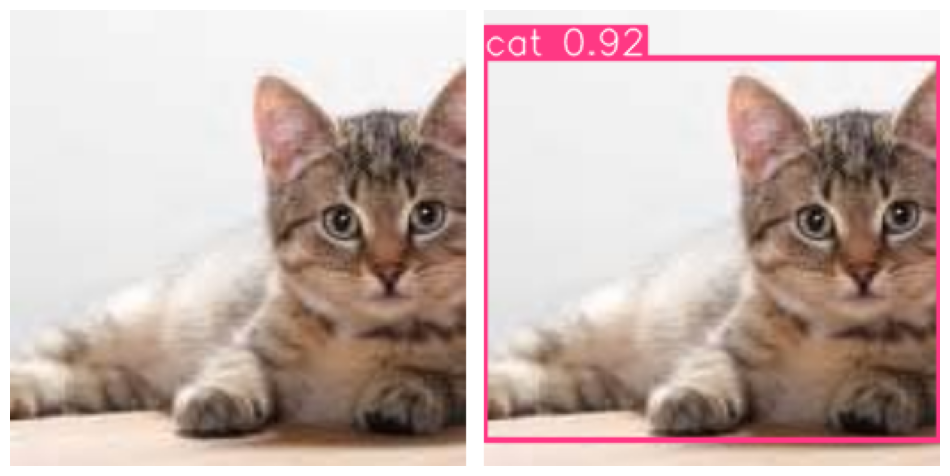

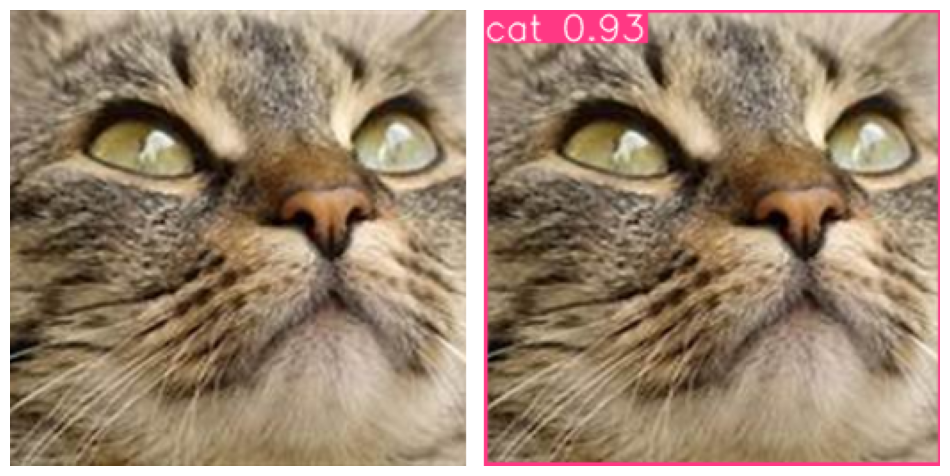

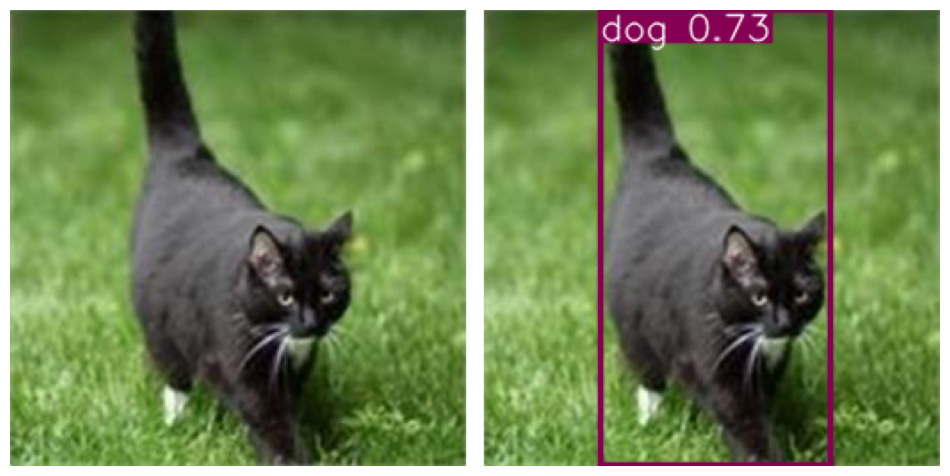

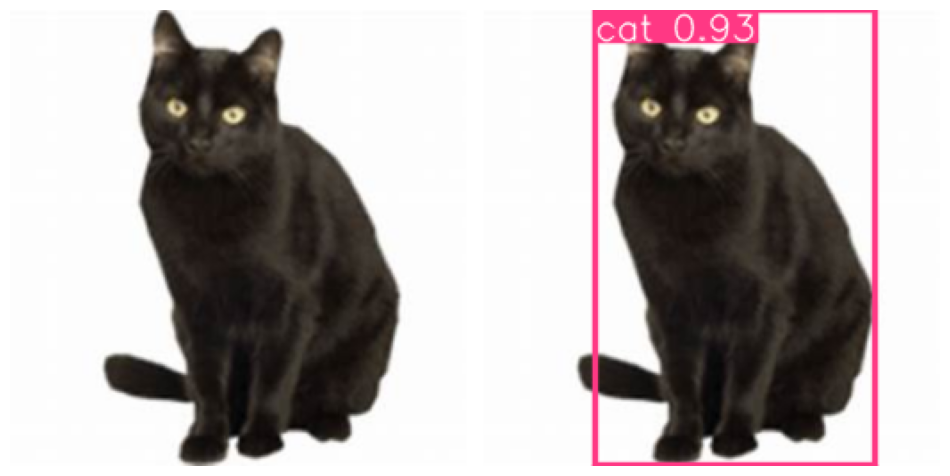

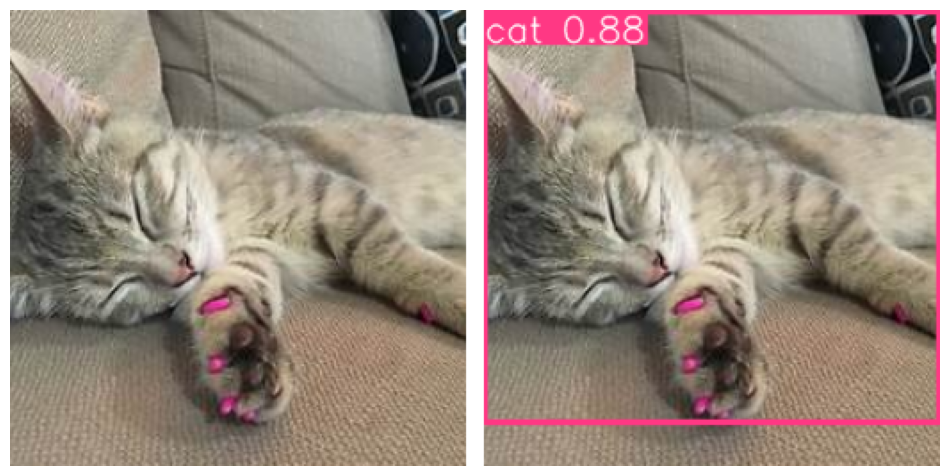

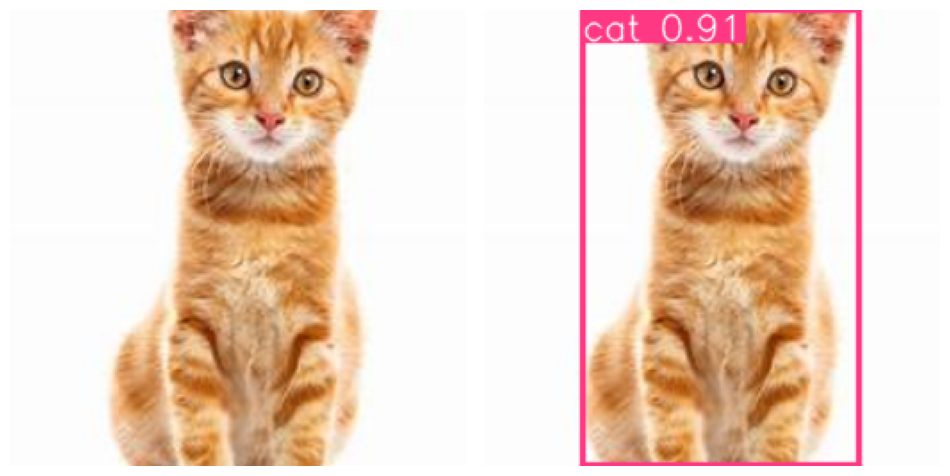

In [68]:
import os
import numpy as np
import torch
import torch.utils.data as data
from torchvision import transforms

BATCH_SIZE = 10
PATH_TO_DATA = './animals10small/data/cat'
Transformer = transforms.Compose([
    transforms.Resize(256),
    transforms.CenterCrop(256),
    transforms.ToTensor()
    ])


dataset = FolderDataset(PATH_TO_DATA, transform = Transformer)
loader = data.DataLoader(dataset, batch_size=BATCH_SIZE, shuffle=True,  num_workers=4)

for idx, batch_data in enumerate(loader):
  results = model.predict(
    source=batch_data,
    conf=0.3
  )
  for idx, result in enumerate(results):
    original_img_rgb = result.orig_img
    annotated_img_rgb = result.plot()
    show_images(original_img_rgb, annotated_img_rgb, gap_size=10, padded_gray = 255)
  #
  if idx > 1:
    break
